## Цифровой сигнал. Sample Rate, Bit Depth, как выглядят данные.
Теперь давайте сфокуссируемся на характеристиках цифрового сигнала и том, как выглядят данные, с которыми мы будем работать. На этих характеристиках мы чуть более заострим внимание и капнем глубже, потому что без понимания этих вещей работать со звуком будет сложно. Сейчас поверхностно пробежимся по ним и затем я максимально наглядно постараюсь про них рассказать, потому что некоторые из них могут на первый взгляд быть неразличимы (как битрейт и семпл рейт, например)

У оцифрованного звука появляется ещё ряд новых важных для нас характеристик:
- частота дискретизации. Определяет сколько сэмплов в секунду оцифровывается (Sample Rate, 22500/44100/48000 Герц)
- число каналов (моно/стерео)
- глубина квантования (Bit Depth, 16/24/32 бит) - определяет динамический диапазон и точность представления амплитуды сигнала (пример - динамический диапазон матрицы фотоаппарата)

In [33]:
import librosa

AUDIO_PATH = "audio/f_bass.mp3"

# Тут я дебаггером показываю как выглядит y
y, sr = librosa.load(AUDIO_PATH)

f"Sample Rate: {sr}"


'Sample Rate: 22050'

## Sample Rate

Sample rate (частота дискретизации) — это количество измерений (или «снимков») звукового сигнала в секунду. Чем выше частота дискретизации, тем точнее и качественнее будет воспроизведение звука.

Например:

Частота 44100 Гц (или 44.1 кГц) означает, что каждую секунду звука записано 44100 отдельных значений.
Чем выше это число, тем лучше звуковой сигнал соответствует оригиналу, но при этом увеличивается размер аудиофайла.
Аналогия:
Представьте, что вы снимаете видео: чем больше кадров в секунду (fps), тем плавнее выглядит движение. В аудио — аналогичная ситуация: чем выше sample rate, тем плавнее и точнее звук.

### Длительность аудиосигнала = $\frac{\mathrm{Количество\ значений} \quad y}{\mathrm{Частота\ дискретизации}}$ сек.

In [62]:
print(f"Первые 10 значений вектора y первой секунды аудио:\n{y[sr:sr+10]}\n")
print(f"Размерность вектора 'y': {len(y)}\n")
print(f"Длительность аудио, зная sample rate и количество значений вектора:\nlen(y)/sr = {round(len(y) / sr, 2)} сек.")

Первые 10 значений вектора y первой секунды аудио:
[-0.10082307 -0.09869229 -0.09732231 -0.09704224 -0.09707618 -0.0964551
 -0.09499681 -0.09314656 -0.09166308 -0.09034919]

Размерность вектора 'y': 970024

Длительность аудио, зная sample rate и количество значений вектора:
len(y)/sr = 40.42 сек.


In [6]:
import IPython.display as ipd

# Что произойдёт, если мы укажем недостоверный sample rate?
ipd.display(ipd.Audio(y, rate=sr))
ipd.display(ipd.Audio(y, rate=sr / 2))
ipd.display(ipd.Audio(y, rate=sr * 4))


### Bit Depth

**Bit depth** (глубина квантования) — это количество бит, используемое для хранения одного отсчёта амплитуды аудиосигнала. Чем больше bit depth, тем точнее передаётся диапазон громкости и мельче шаги между уровнями сигнала.

Например:

При 16-битном аудио каждый отсчёт хранится как целое число типа int16 (значения от −32768 до 32767)

Библиотека Librosa по умолчанию загружает аудио в формате с плавающей точкой (float32).
Это можно сравнить с матрицей фотоаппарата:
чем больше bit depth у матрицы (например, 12 бит против 8 бит), тем больше оттенков света от чёрного до белого может быть зафиксировано, а значит, изображение получается более детализированным и менее склонным к потере деталей в тенях и светах.

In [3]:
print(f"Тип данных, используемый при хранении данных аудиосигнала y: {y.dtype}")
print(f"Диапазон значений y: {y.min()} {y.max()}")

Тип данных, используемый при хранении данных аудиосигнала y: float32
Диапазон значений y: -0.7290468811988831 0.901073157787323


In [55]:
import numpy as np

# Нормируем 'y' в диапазон [-128, 127] и переводим в int8 все значения вектора
y_8bit = (y * 127).astype(np.int8)

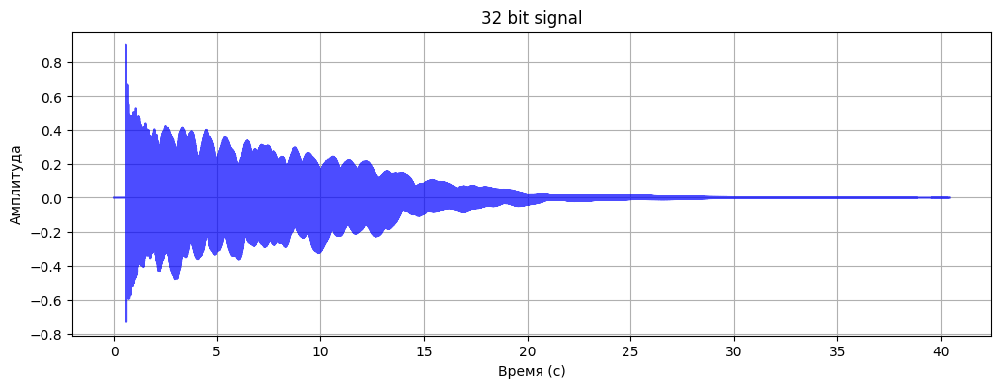

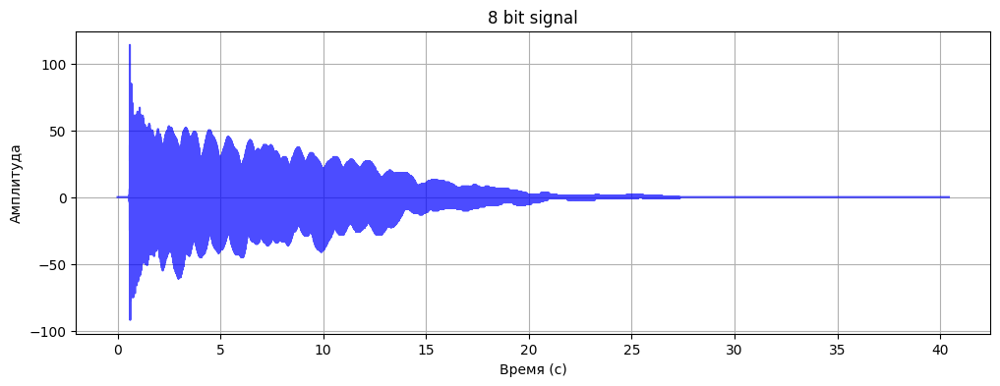

In [56]:
from plot import plot_audio_signal

plot_audio_signal(y, sr=sr, title="32 bit signal")
plot_audio_signal(y_8bit, sr=sr, title="8 bit signal")

ipd.display(ipd.Audio(y, rate=sr))
ipd.display(ipd.Audio(y_8bit, rate=sr))

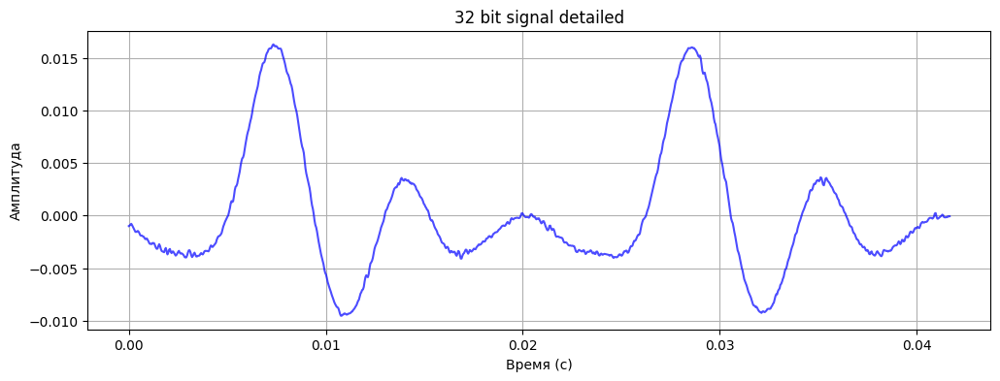

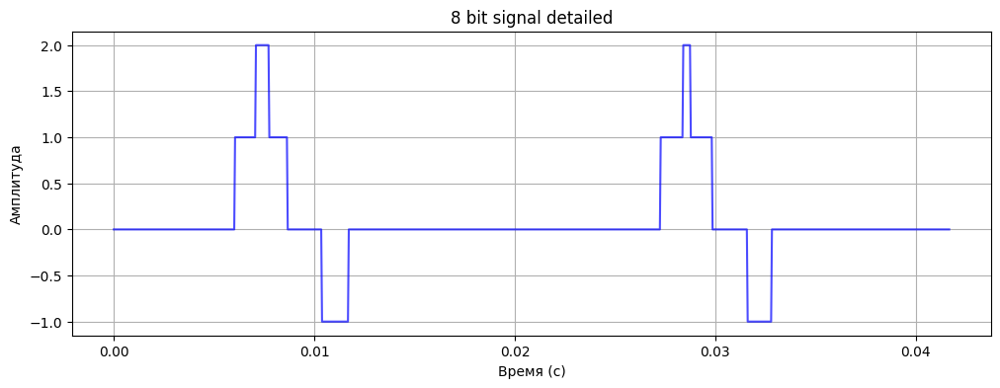

In [59]:
START_TIME_SEC = sr * 25
VALUES_TO_SHOW = 1000

plot_audio_signal(y[START_TIME_SEC:START_TIME_SEC + VALUES_TO_SHOW], sr=sr, title="32 bit signal detailed")
plot_audio_signal(y_8bit[START_TIME_SEC:START_TIME_SEC + VALUES_TO_SHOW], sr=sr, title="8 bit signal detailed")